# Introdução

Mineração de dados sobre os acidentes de trânsito nas rodovias federais brasileiras durante o período de tempo de Janeiro de 2023 até Janeiro de 2025. Foi utilizado no treinamento dos modelos os algoritimos Naive Bayes, Random Forest, SVM e RBFNN. A análise do impacto das váriaveis no modelo Random Forest foi feita com base no SHAP values que utiliza a teoria dos jogos para identificar a contribuição dos envolvidos no treinamento no resultado final. Os datasets foram disponibilizados pelo Plano de Dados Abertos da PRF através do site: **https://www.gov.br/prf/pt-br/acesso-a-informacao/dados-abertos/dados-abertos-da-prf** na categoria de Agrupados por ocorrência. 

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, classification_report
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import shap

# Carregamento e transformação dos dados

In [2]:
df1 = pd.read_csv("datatran2025.csv", encoding="ANSI", delimiter=";")
df2 = pd.read_csv("datatran2024.csv", encoding="ANSI", delimiter=";")
df3 = pd.read_csv("datatran2023.csv", encoding="ANSI", delimiter=";")
df = pd.concat([df1, df2, df3])
df

,id,data_inversa,dia_semana,horario,uf,br,km,municipio,causa_acidente,tipo_acidente,...,feridos_graves,ilesos,ignorados,feridos,veiculos,latitude,longitude,regional,delegacia,uop
0,652493.0,2025-01-01,quarta-feira,06:20:00,SP,116,225,GUARULHOS,Reação tardia ou ineficiente do condutor,Tombamento,...,0,0,1,1,2,-23.485868,-46.540753,SPRF-SP,DEL01-SP,UOP01-DEL01-SP
1,652519.0,2025-01-01,quarta-feira,07:50:00,CE,116,"546,2",PENAFORTE,Pista esburacada,Colisão frontal,...,0,1,4,1,6,-7.812288,-39.083333,SPRF-CE,DEL05-CE,UOP03-DEL05-CE
2,652522.0,2025-01-01,quarta-feira,08:45:00,PR,369,"88,2",CORNELIO PROCOPIO,Reação tardia ou ineficiente do condutor,Colisão traseira,...,0,2,0,3,2,-23.182565,-50.637228,SPRF-PR,DEL07-PR,UOP05-DEL07-PR
3,652544.0,2025-01-01,quarta-feira,11:00:00,PR,116,74,CAMPINA GRANDE DO SUL,Reação tardia ou ineficiente do condutor,Saída de leito carroçável,...,0,4,0,1,2,-25.365177,-49.04223,SPRF-PR,DEL01-PR,UOP02-DEL01-PR
4,652549.0,2025-01-01,quarta-feira,09:30:00,MG,251,471,FRANCISCO SA,Velocidade Incompatível,Colisão frontal,...,1,1,2,2,4,-16.468013,-43.431213,SPRF-MG,DEL12-MG,UOP01-DEL12-MG
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67761,619297.0,2023-04-19,quarta-feira,20:50:00,PR,376,475,PONTA GROSSA,Pedestre andava na pista,Atropelamento de Pedestre,...,0,4,0,0,2,"-25,05467785","-50,22938892",NaN,NaN,NaN
67762,619475.0,2023-06-20,terça-feira,20:30:00,MA,222,"206,5",ITAPECURU MIRIM,Acessar a via sem observar a presença dos outr...,Colisão transversal,...,0,1,0,1,2,"-3,40552588","-44,35174989",NaN,NaN,NaN
67763,619476.0,2023-05-18,quinta-feira,06:15:00,ES,101,"62,7",SAO MATEUS,Conversão proibida,Colisão transversal,...,1,0,0,3,2,"-18,69020499","-39,86154403",NaN,NaN,NaN
67764,619913.0,2023-08-22,terça-feira,15:00:00,MG,50,15,UBERLANDIA,Acumulo de areia ou detritos sobre o pavimento,Tombamento,...,1,0,0,1,1,"-18,91385522","-48,17243636",NaN,NaN,NaN


In [3]:
# Remover colunas irrelevantes
colunas_remover = ['id', 'horario', 'uf', 'km', 'municipio', 'pessoas', 'ignorados', 'regional', 'delegacia', 'uop', 'mortos', 'feridos_leves', 'feridos_graves', 'ilesos', 'br']
df.drop(columns=colunas_remover, inplace=True)

In [4]:
df.shape

(146400, 15)

In [20]:
#Para facilitar a leitura do notebook coloquei até 20 categorias, caso queira ver todas as categorias basta tirar a condicional
for coluna, dados in df.items():
    print(coluna)
    categorias = dados.unique()
    i = 0
    for categoria in categorias:
        if (i > 20):
            print("...")
            break
        else:
            print(f"{categoria} ")
        i += 1
    print()

data_inversa
2025-01-01 00:00:00 
2025-01-02 00:00:00 
2025-01-03 00:00:00 
2025-01-04 00:00:00 
2025-01-05 00:00:00 
2025-01-06 00:00:00 
2025-01-07 00:00:00 
2025-01-08 00:00:00 
2025-01-09 00:00:00 
2025-01-10 00:00:00 
2025-01-11 00:00:00 
2025-01-12 00:00:00 
2025-01-13 00:00:00 
2025-01-14 00:00:00 
2025-01-15 00:00:00 
2025-01-16 00:00:00 
2025-01-17 00:00:00 
2025-01-18 00:00:00 
2025-01-19 00:00:00 
2025-01-20 00:00:00 
2025-01-21 00:00:00 
...

dia_semana
Quarta-feira 
Quinta-feira 
Sexta-feira 
Sábado 
Domingo 
Segunda-feira 
Terça-feira 

causa_acidente
Reação tardia ou ineficiente do condutor 
Outros 
Velocidade Incompatível 
Transitar na contramão 
Ausência de reação do condutor 
Demais falhas mecânicas ou elétricas 
Ingestão de álcool pelo condutor 
Condutor Dormindo 
Manobra de mudança de faixa 
Acessar a via sem observar a presença dos outros veículos 
Condutor deixou de manter distância do veículo da frente 
Ultrapassagem Indevida 
Desrespeitar a preferência no cruzam

In [6]:
df.replace({'Ignorado': None}, inplace=True)

In [7]:
df.isnull().sum()

data_inversa                 0
dia_semana                   0
causa_acidente               0
tipo_acidente                0
classificacao_acidente       3
fase_dia                     0
sentido_via                  0
condicao_metereologica    1834
tipo_pista                   0
tracado_via                  0
uso_solo                     0
feridos                      0
veiculos                     0
latitude                     0
longitude                    0
dtype: int64

In [8]:
df.dropna(inplace=True)
df

,data_inversa,dia_semana,causa_acidente,tipo_acidente,classificacao_acidente,fase_dia,sentido_via,condicao_metereologica,tipo_pista,tracado_via,uso_solo,feridos,veiculos,latitude,longitude
0,2025-01-01,quarta-feira,Reação tardia ou ineficiente do condutor,Tombamento,Com Vítimas Feridas,Pleno dia,Decrescente,Céu Claro,Múltipla,Reta;Declive,Sim,1,2,-23.485868,-46.540753
1,2025-01-01,quarta-feira,Pista esburacada,Colisão frontal,Com Vítimas Fatais,Pleno dia,Crescente,Céu Claro,Simples,Reta,Não,1,6,-7.812288,-39.083333
2,2025-01-01,quarta-feira,Reação tardia ou ineficiente do condutor,Colisão traseira,Com Vítimas Feridas,Pleno dia,Crescente,Sol,Dupla,Reta;Aclive,Sim,3,2,-23.182565,-50.637228
3,2025-01-01,quarta-feira,Reação tardia ou ineficiente do condutor,Saída de leito carroçável,Com Vítimas Feridas,Pleno dia,Crescente,Céu Claro,Dupla,Reta,Não,1,2,-25.365177,-49.04223
4,2025-01-01,quarta-feira,Velocidade Incompatível,Colisão frontal,Com Vítimas Feridas,Pleno dia,Decrescente,Chuva,Simples,Curva;Declive,Não,2,4,-16.468013,-43.431213
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67760,2023-09-24,domingo,Ausência de reação do condutor,Colisão frontal,Com Vítimas Feridas,Amanhecer,Decrescente,Céu Claro,Simples,Reta,Sim,3,2,"-26,92203838","-48,95884931"
67761,2023-04-19,quarta-feira,Pedestre andava na pista,Atropelamento de Pedestre,Com Vítimas Fatais,Plena Noite,Crescente,Céu Claro,Dupla,Reta,Não,0,2,"-25,05467785","-50,22938892"
67762,2023-06-20,terça-feira,Acessar a via sem observar a presença dos outr...,Colisão transversal,Com Vítimas Feridas,Plena Noite,Crescente,Céu Claro,Simples,Reta,Sim,1,2,"-3,40552588","-44,35174989"
67763,2023-05-18,quinta-feira,Conversão proibida,Colisão transversal,Com Vítimas Feridas,Pleno dia,Crescente,Céu Claro,Simples,Reta,Não,3,2,"-18,69020499","-39,86154403"


In [9]:

df['dia_semana'] = df['dia_semana'].astype('category')
df['causa_acidente'] = df['causa_acidente'].astype('category')
df['tipo_acidente'] = df['tipo_acidente'].astype('category')
df['classificacao_acidente'] = df['classificacao_acidente'].astype('category')
df['fase_dia'] = df['fase_dia'].astype('category')
df['sentido_via'] = df['sentido_via'].astype('category')
df['condicao_metereologica'] = df['condicao_metereologica'].astype('category')
df['tipo_pista'] = df['tipo_pista'].astype('category')
df['tracado_via'] = df['tracado_via'].astype('category')
df['uso_solo'] = df['uso_solo'].astype('category')
df['data_inversa'] = pd.to_datetime(df['data_inversa'])

In [10]:
#Existem datasets com as coordenadas em formato de string
#Para fazer o gráfico de densidade com as localizações no mapa é necessário está em float
def convert_to_float(value):
    if isinstance(value, str):
        try:
            return float(value.replace(',', '.'))
        except ValueError:
            return value 
    return value 

df['latitude'] = df['latitude'].apply(convert_to_float)
df['longitude'] = df['longitude'].apply(convert_to_float)

In [11]:
df['mes'] = df['data_inversa'].dt.month
df['ano'] = df['data_inversa'].dt.year
df['dia_semana'] = df['data_inversa'].dt.day_name()
traducao_dias = {
    'Monday': 'Segunda-feira',
    'Tuesday': 'Terça-feira',
    'Wednesday': 'Quarta-feira',
    'Thursday': 'Quinta-feira',
    'Friday': 'Sexta-feira',
    'Saturday': 'Sábado',
    'Sunday': 'Domingo'
}

df['dia_semana'] = df['dia_semana'].map(traducao_dias)
df

,data_inversa,dia_semana,causa_acidente,tipo_acidente,classificacao_acidente,fase_dia,sentido_via,condicao_metereologica,tipo_pista,tracado_via,uso_solo,feridos,veiculos,latitude,longitude,mes,ano
0,2025-01-01,Quarta-feira,Reação tardia ou ineficiente do condutor,Tombamento,Com Vítimas Feridas,Pleno dia,Decrescente,Céu Claro,Múltipla,Reta;Declive,Sim,1,2,-23.485868,-46.540753,1,2025
1,2025-01-01,Quarta-feira,Pista esburacada,Colisão frontal,Com Vítimas Fatais,Pleno dia,Crescente,Céu Claro,Simples,Reta,Não,1,6,-7.812288,-39.083333,1,2025
2,2025-01-01,Quarta-feira,Reação tardia ou ineficiente do condutor,Colisão traseira,Com Vítimas Feridas,Pleno dia,Crescente,Sol,Dupla,Reta;Aclive,Sim,3,2,-23.182565,-50.637228,1,2025
3,2025-01-01,Quarta-feira,Reação tardia ou ineficiente do condutor,Saída de leito carroçável,Com Vítimas Feridas,Pleno dia,Crescente,Céu Claro,Dupla,Reta,Não,1,2,-25.365177,-49.042230,1,2025
4,2025-01-01,Quarta-feira,Velocidade Incompatível,Colisão frontal,Com Vítimas Feridas,Pleno dia,Decrescente,Chuva,Simples,Curva;Declive,Não,2,4,-16.468013,-43.431213,1,2025
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67760,2023-09-24,Domingo,Ausência de reação do condutor,Colisão frontal,Com Vítimas Feridas,Amanhecer,Decrescente,Céu Claro,Simples,Reta,Sim,3,2,-26.922038,-48.958849,9,2023
67761,2023-04-19,Quarta-feira,Pedestre andava na pista,Atropelamento de Pedestre,Com Vítimas Fatais,Plena Noite,Crescente,Céu Claro,Dupla,Reta,Não,0,2,-25.054678,-50.229389,4,2023
67762,2023-06-20,Terça-feira,Acessar a via sem observar a presença dos outr...,Colisão transversal,Com Vítimas Feridas,Plena Noite,Crescente,Céu Claro,Simples,Reta,Sim,1,2,-3.405526,-44.351750,6,2023
67763,2023-05-18,Quinta-feira,Conversão proibida,Colisão transversal,Com Vítimas Feridas,Pleno dia,Crescente,Céu Claro,Simples,Reta,Não,3,2,-18.690205,-39.861544,5,2023


In [12]:
df.reset_index(inplace=True)
df.drop(columns=['index'], inplace=True)

In [15]:
#Existe um alto número de categorias em causa_acidente e tracado_via, o que aumentou o tempo de treinamento e diminuiu a performace.
limite = 2500
frequencia = df['causa_acidente'].value_counts()

categorias_para_agregar = frequencia[frequencia < limite].index

df['causa_acidente'] = df['causa_acidente'].apply(lambda x: 'Outros' if x in categorias_para_agregar else x)
df['causa_acidente'] = df['causa_acidente'].astype('category')

In [16]:
limite = 2200
frequencia = df['tracado_via'].value_counts()

categorias_para_agregar = frequencia[frequencia < limite].index

df['tracado_via'] = df['tracado_via'].apply(lambda x: 'Outros' if x in categorias_para_agregar else x)
df['tracado_via'] = df['tracado_via'].astype('category')

In [13]:
frequencia = df['tracado_via'].value_counts()

# Identificar categorias que estão abaixo do limite
categorias_para_agregar = frequencia[frequencia > 2200].values
categorias_para_agregar.sum()

117327

In [14]:
frequencia = df['causa_acidente'].value_counts()

categorias_para_agregar = frequencia[frequencia > 2500].values
categorias_para_agregar.sum()

118992

# Análise exploratória 

Text(0, 0.5, 'Contagem')

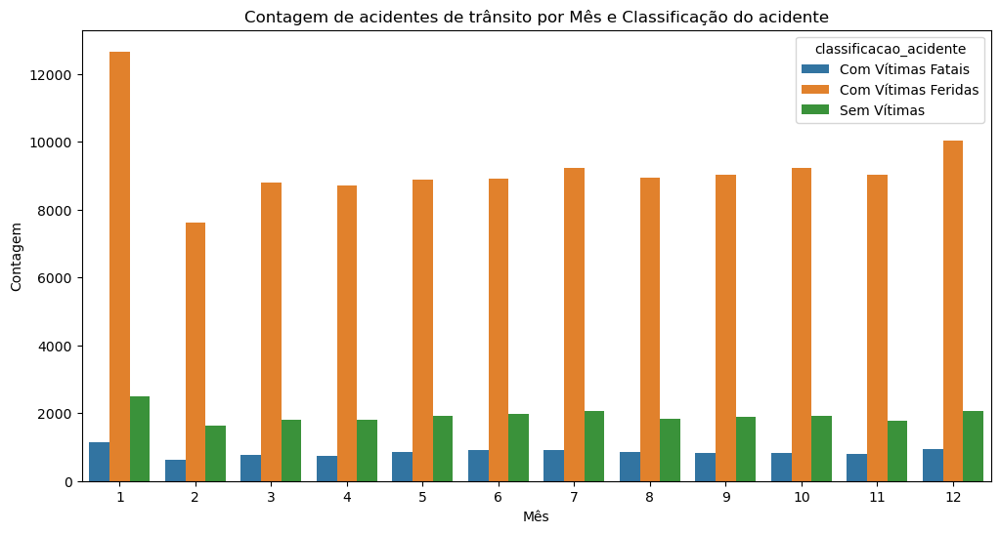

In [144]:
plt.figure(figsize=(12,6))
agrupado = df.groupby(["mes", "classificacao_acidente"], observed=False).size().reset_index(name="Contagem")
sns.barplot(x = 'mes', y = 'Contagem', hue='classificacao_acidente', data=agrupado)
plt.title(f'Contagem de acidentes de trânsito por Mês e Classificação do acidente')
plt.xlabel('Mês')
plt.ylabel('Contagem')

E:\Anaconda1\Lib\site-packages\seaborn\categorical.py:641: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



Text(0, 0.5, 'Contagem')

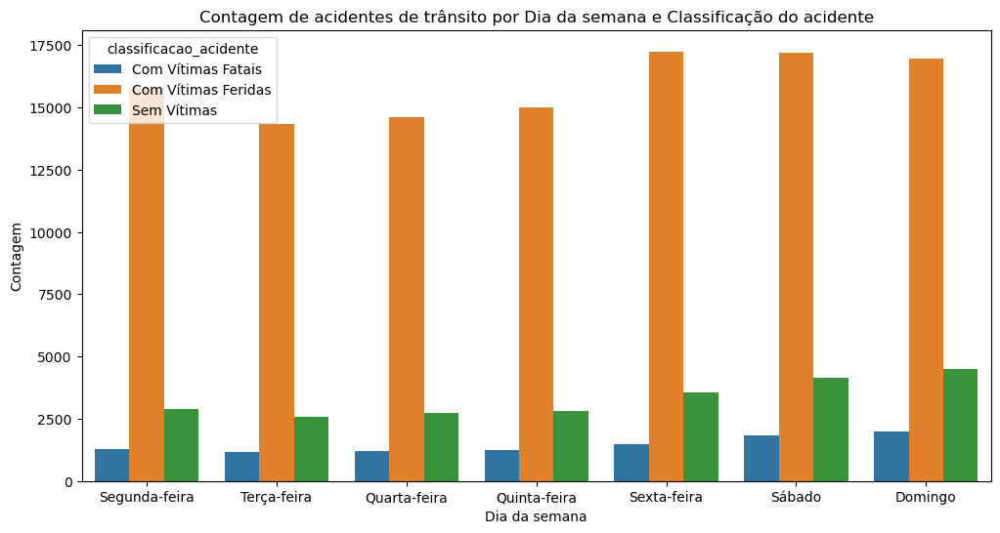

In [145]:
plt.figure(figsize=(12,6))
agrupado = df.groupby(["dia_semana", "classificacao_acidente"], observed=False).size().reset_index(name="Contagem")
#Para mostrar os dias na ordem correta é preciso fazer a ordernação de forma manual.
ordem_dias = [
    'Segunda-feira',
    'Terça-feira',
    'Quarta-feira',
    'Quinta-feira',
    'Sexta-feira',
    'Sábado',
    'Domingo'
]
agrupado['dia_semana'] = pd.Categorical(
    agrupado['dia_semana'], 
    categories=ordem_dias, 
    ordered=True
)
agrupado = agrupado.sort_values('dia_semana')

sns.barplot(x = 'dia_semana', y = 'Contagem', hue='classificacao_acidente', data=agrupado)
plt.title(f'Contagem de acidentes de trânsito por Dia da semana e Classificação do acidente')
plt.xlabel('Dia da semana')
plt.ylabel('Contagem')

Text(0, 0.5, 'Contagem')

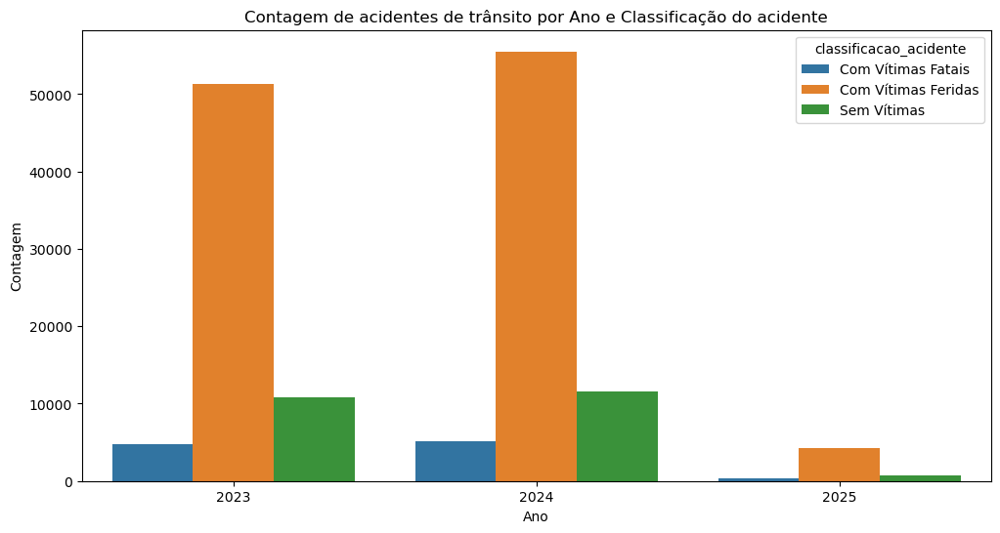

In [146]:
plt.figure(figsize=(12,6))
agrupado = df.groupby(["ano", "classificacao_acidente"], observed=False).size().reset_index(name="Contagem")
sns.barplot(x = 'ano', y = 'Contagem', hue='classificacao_acidente', data=agrupado)
plt.title(f'Contagem de acidentes de trânsito por Ano e Classificação do acidente')
plt.xlabel('Ano')
plt.ylabel('Contagem')

In [147]:
#Os valores com muitas categorias a contagem aparece embaixo com a ordem correspondente.
colunas = df.select_dtypes(include='category')
for i, col in enumerate(colunas, 1):
    if col == 'classificacao_acidente':
        continue

    agrupado = df.groupby([col, "classificacao_acidente"], observed=False).size().reset_index(name="Contagem")
    print(agrupado)
    print()

                                       causa_acidente classificacao_acidente  \
0   Acessar a via sem observar a presença dos outr...     Com Vítimas Fatais   
1   Acessar a via sem observar a presença dos outr...    Com Vítimas Feridas   
2   Acessar a via sem observar a presença dos outr...            Sem Vítimas   
3                                    Animais na Pista     Com Vítimas Fatais   
4                                    Animais na Pista    Com Vítimas Feridas   
5                                    Animais na Pista            Sem Vítimas   
6                      Ausência de reação do condutor     Com Vítimas Fatais   
7                      Ausência de reação do condutor    Com Vítimas Feridas   
8                      Ausência de reação do condutor            Sem Vítimas   
9             Avarias e/ou desgaste excessivo no pneu     Com Vítimas Fatais   
10            Avarias e/ou desgaste excessivo no pneu    Com Vítimas Feridas   
11            Avarias e/ou desgaste exce

In [148]:
lats = df['latitude']
lons = df['longitude']
fig = px.density_mapbox(lat=lats, lon=lons, radius=5,
                        zoom=3, mapbox_style="open-street-map")
fig.update_layout(title="Mapa de Densidade dos acidentes de trânsitos nas rodovias federais")
fig.show()

# Treinamento dos modelos

In [149]:
df['mes'] = df['mes'].astype("category")
df['ano'] = df['ano'].astype("category")
df['dia_semana'] = df['dia_semana'].astype("category")

In [150]:
df.drop(columns=['data_inversa', 'latitude', 'longitude'], inplace=True)

In [151]:
# Codificação de variáveis categóricas
label_encoders = {}
for col in df.select_dtypes(include=['category']).columns:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le

In [152]:
# Definir features e target
y = df['classificacao_acidente']
X = df.drop(columns=['classificacao_acidente', 'veiculos', 'feridos'])

In [153]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [154]:
# Modelos
modelos = {
    'Naive Bayes' : GaussianNB(),
    'Random Forest': RandomForestClassifier(n_estimators=50, random_state=42),
    'SVM': SVC(kernel='rbf', random_state=42),
    'RBF Neural Network': MLPClassifier(hidden_layer_sizes=(50,), activation='tanh', solver='adam', max_iter=100, random_state=42)
}

In [155]:
# Treinamento e avaliação
desempenho = {}
shap_values_all_folds = []
X_test_all_folds = []
for nome, modelo in modelos.items():
    accs = []
    modelo.fit(X_train, y_train)
    y_pred = modelo.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    print("....")
    print()
    desempenho[nome] = acc
    print(f'\nModelo: {nome}')
    print(f'Acurácia: {acc:.4f}')
    print(classification_report(y_test, y_pred))

....


Modelo: Naive Bayes
Acurácia: 0.7663
              precision    recall  f1-score   support

           0       0.29      0.02      0.04      3095
           1       0.77      1.00      0.87     33313
           2       0.00      0.00      0.00      6962

    accuracy                           0.77     43370
   macro avg       0.35      0.34      0.30     43370
weighted avg       0.61      0.77      0.67     43370



E:\Anaconda1\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

E:\Anaconda1\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

E:\Anaconda1\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



....


Modelo: Random Forest
Acurácia: 0.7696
              precision    recall  f1-score   support

           0       0.34      0.13      0.19      3095
           1       0.80      0.94      0.86     33313
           2       0.55      0.23      0.32      6962

    accuracy                           0.77     43370
   macro avg       0.56      0.43      0.46     43370
weighted avg       0.73      0.77      0.73     43370

....


Modelo: SVM
Acurácia: 0.7681
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      3095
           1       0.77      1.00      0.87     33313
           2       0.00      0.00      0.00      6962

    accuracy                           0.77     43370
   macro avg       0.26      0.33      0.29     43370
weighted avg       0.59      0.77      0.67     43370



E:\Anaconda1\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

E:\Anaconda1\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

E:\Anaconda1\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



....


Modelo: RBF Neural Network
Acurácia: 0.7827
              precision    recall  f1-score   support

           0       0.48      0.05      0.08      3095
           1       0.79      0.99      0.87     33313
           2       0.74      0.14      0.23      6962

    accuracy                           0.78     43370
   macro avg       0.67      0.39      0.40     43370
weighted avg       0.76      0.78      0.71     43370



E:\Anaconda1\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.



# Análise das váriaveis utilizadas no modelo Random Forest 

In [162]:
#Com vitimas feridas: 1
#Com vitimas fatais: 0
#Sem vitimas: 2
X_sample = X_test.sample(n=5000, random_state=42)
            
explainer = shap.TreeExplainer(modelos['Random Forest'])
shap_values = explainer.shap_values(X_sample)  
shap_values = np.transpose(shap_values, (2, 0 ,1))


Summary plot para a classe 0:


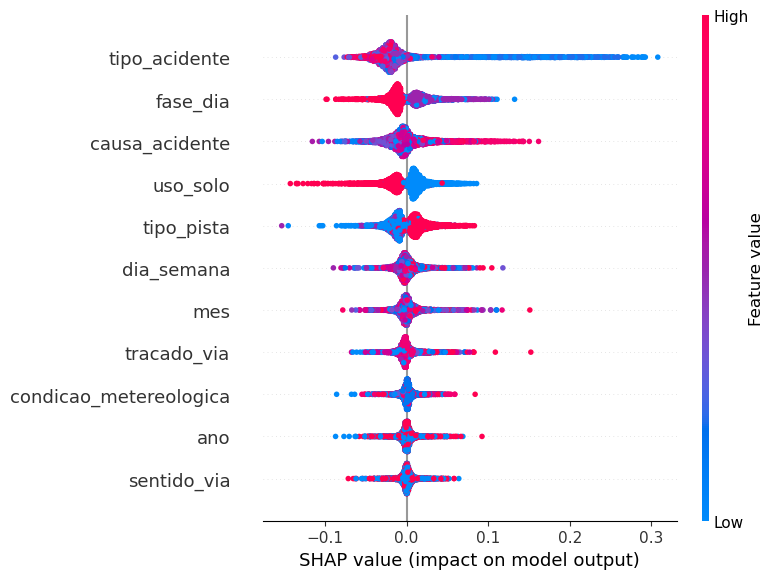


Summary plot para a classe 1:


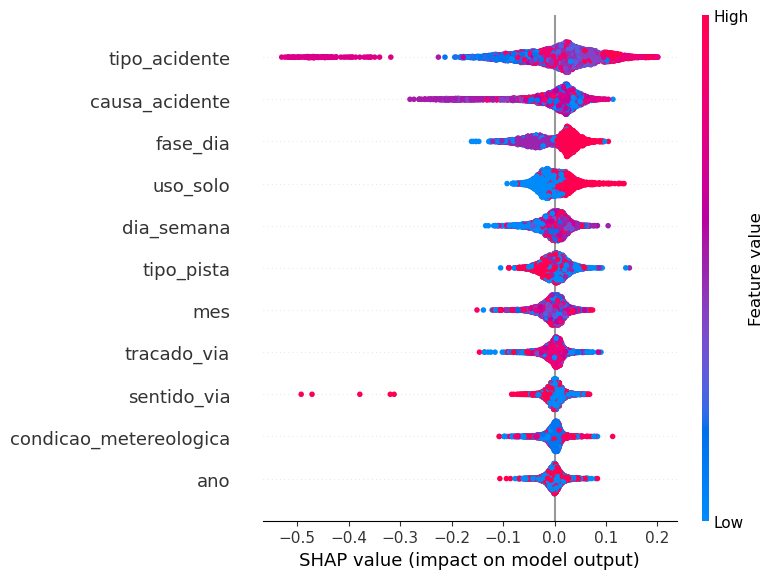


Summary plot para a classe 2:


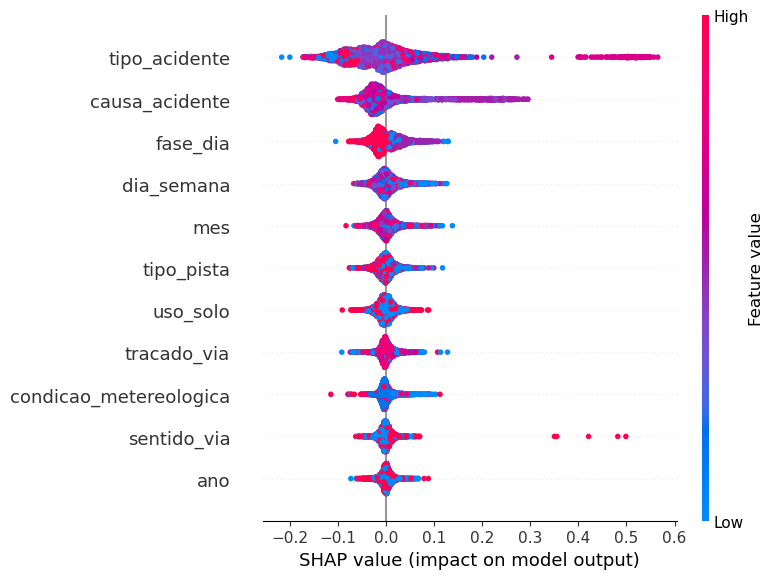

In [157]:
#Quanto maior o shap_values, menor a gravidade do acidente
#O feature value indica categoria da váriavel com base no número correspondente ao encoding
for i in range(3):  
    print(f"\nSummary plot para a classe {i}:")
    shap.summary_plot(shap_values[i], X_sample, feature_names=X.columns)

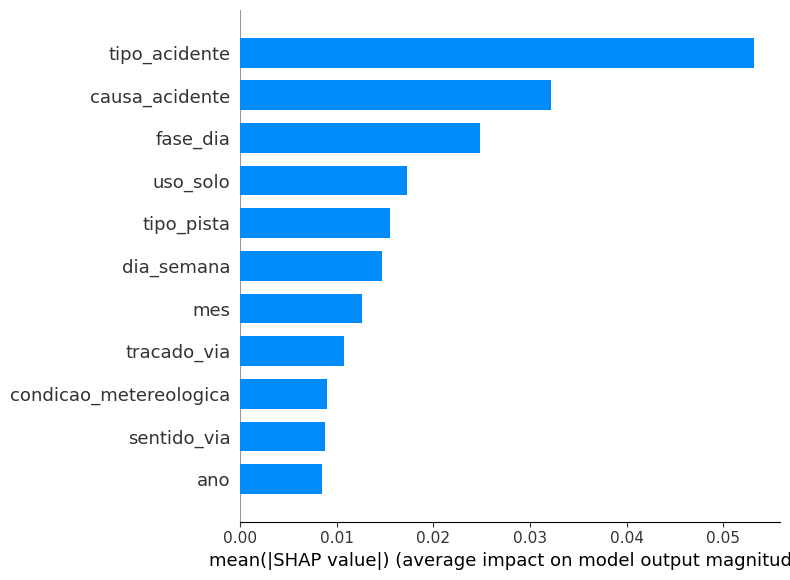

In [158]:
#shap values em números absolutos
shap_values_reshaped = np.concatenate(shap_values, axis=0)
X_sample_repeated = np.repeat(X_sample, repeats=3, axis=0)
shap.summary_plot(
    shap_values_reshaped,
    X_sample_repeated,
    plot_type="bar",
    feature_names=X.columns,
)

In [159]:
#Saber quais os códigos de encoding correspondentes as categorias
X_sample_decoded = X_sample.copy()
for col, encoder in label_encoders.items():
    if (col == "classificacao_acidente"):
        continue
    X_sample_decoded[col] = encoder.inverse_transform(X_sample[col])
X_sample_decoded

,dia_semana,causa_acidente,tipo_acidente,fase_dia,sentido_via,condicao_metereologica,tipo_pista,tracado_via,uso_solo,mes,ano
74802,Domingo,Trafegar com motocicleta (ou similar) entre as...,Colisão lateral mesmo sentido,Plena Noite,Crescente,Nublado,Dupla,Reta,Sim,12,2024
87546,Quarta-feira,Ausência de reação do condutor,Colisão transversal,Pleno dia,Crescente,Céu Claro,Simples,Curva,Sim,8,2023
111455,Domingo,Animais na Pista,Queda de ocupante de veículo,Plena Noite,Decrescente,Nublado,Dupla,Reta,Sim,5,2023
46507,Sábado,Ausência de reação do condutor,Colisão traseira,Pleno dia,Decrescente,Nublado,Múltipla,Reta,Sim,5,2024
114726,Quinta-feira,Ausência de reação do condutor,Tombamento,Plena Noite,Decrescente,Céu Claro,Simples,Outros,Sim,6,2023
...,...,...,...,...,...,...,...,...,...,...,...
70816,Terça-feira,Ausência de reação do condutor,Queda de ocupante de veículo,Pleno dia,Crescente,Céu Claro,Simples,Reta,Não,11,2024
17438,Quarta-feira,Reação tardia ou ineficiente do condutor,Tombamento,Anoitecer,Crescente,Céu Claro,Dupla,Curva;Declive,Não,7,2024
38839,Sexta-feira,Acessar a via sem observar a presença dos outr...,Colisão transversal,Pleno dia,Crescente,Céu Claro,Simples,Reta,Não,4,2024
24396,Terça-feira,Trafegar com motocicleta (ou similar) entre as...,Colisão lateral mesmo sentido,Pleno dia,Decrescente,Céu Claro,Dupla,Reta,Não,1,2024


In [160]:
X_sample

,dia_semana,causa_acidente,tipo_acidente,fase_dia,sentido_via,condicao_metereologica,tipo_pista,tracado_via,uso_solo,mes,ano
74802,0,12,5,2,0,6,0,6,1,11,1
87546,1,2,7,3,0,1,2,1,1,7,0
111455,0,1,13,2,1,6,0,6,1,4,0
46507,5,2,8,3,1,6,1,6,1,4,1
114726,2,2,16,2,1,1,2,5,1,5,0
...,...,...,...,...,...,...,...,...,...,...,...
70816,6,2,13,3,0,1,2,6,0,10,1
17438,1,11,16,1,0,1,0,2,0,6,1
38839,4,0,7,3,0,1,2,6,0,3,1
24396,6,12,5,3,1,1,0,6,0,0,1


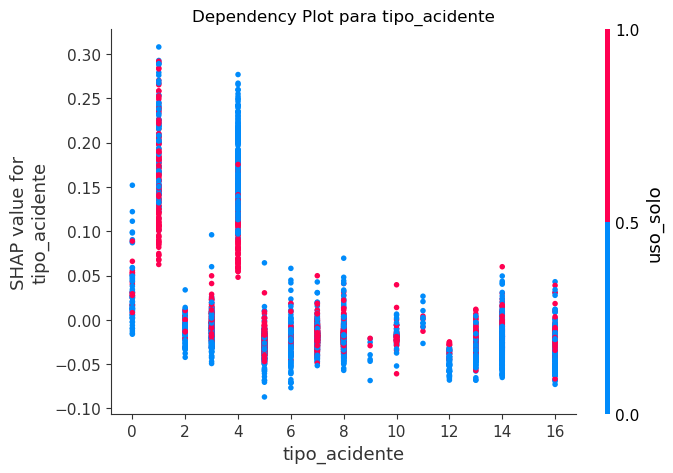

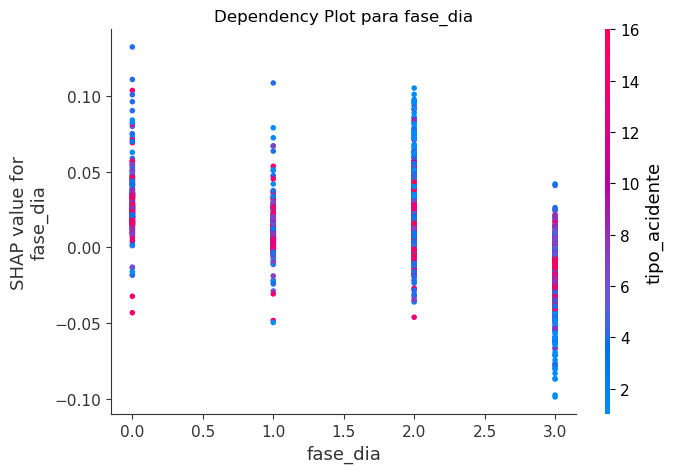

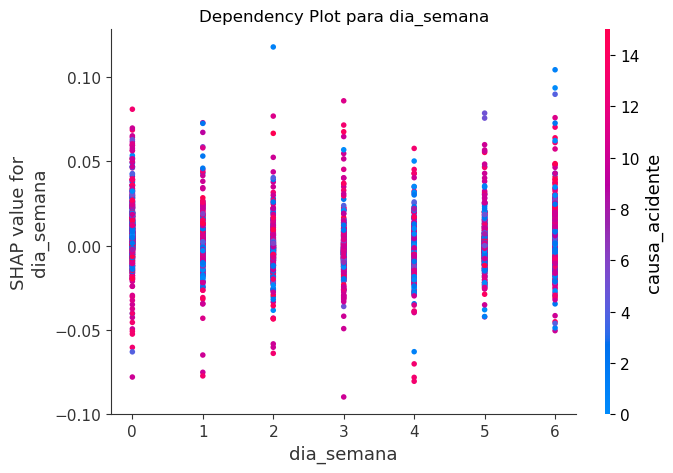

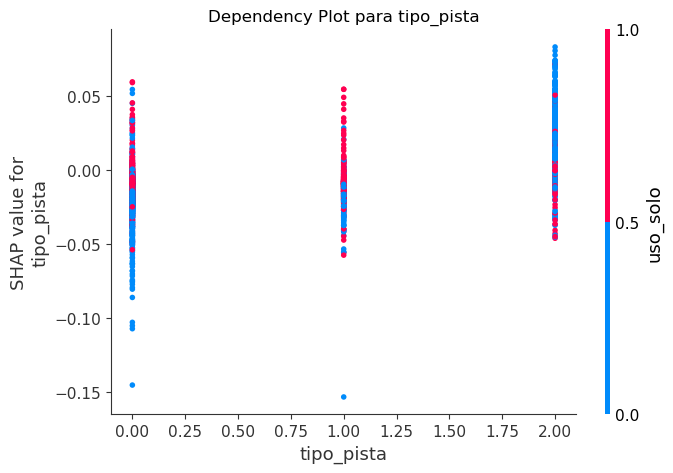

In [161]:
#Relação de multiplo features com os shap_values
#A partir das 4 variaveis mais bem colocadas o proprio shap.dependece_plot encontra as features com maior correlação
top_features = ['tipo_acidente', 'fase_dia', 'dia_semana', 'tipo_pista']

for feature in top_features:
    shap.dependence_plot(
        ind=feature,
        shap_values=shap_values[0],
        features=X_sample,
        interaction_index="auto",
        show=False
    )
    plt.title(f"Dependency Plot para {feature}")
    plt.show()